In [1]:
!pip install opencv-python-headless numpy pillow matplotlib scikit-image



Defaulting to user installation because normal site-packages is not writeable


ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\Lenovo\\AppData\\Roaming\\Python\\Python39\\site-packages\\cv2\\cv2.pyd'
Check the permissions.

You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.


In [2]:
!pip install scikit-image


Defaulting to user installation because normal site-packages is not writeable
  Using cached scikit_image-0.24.0-cp39-cp39-win_amd64.whl (12.9 MB)
  Using cached tifffile-2024.8.30-py3-none-any.whl (227 kB)
  Using cached lazy_loader-0.4-py3-none-any.whl (12 kB)
  Using cached networkx-3.2.1-py3-none-any.whl (1.6 MB)
  Using cached imageio-2.37.0-py3-none-any.whl (315 kB)


You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.


In [2]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage import exposure, img_as_ubyte
from skimage.restoration import denoise_bilateral

# Try importing Real-ESRGAN (optional)
try:
    from realesrgan import RealESRGAN
    REAL_ESRGAN_AVAILABLE = True
except Exception:
    REAL_ESRGAN_AVAILABLE = False


In [3]:
def show_image(title, img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(title)
    plt.show()

def to_gray_uint8(img):
    if img.ndim == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    gray = cv2.normalize(gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return gray


In [4]:
def preprocess_prescription(img):
    """For handwritten or printed prescriptions"""
    gray = to_gray_uint8(img)
    den = cv2.fastNlMeansDenoising(gray, None, h=10)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(den)
    th = cv2.adaptiveThreshold(enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               cv2.THRESH_BINARY, 25, 8)
    merged = cv2.bitwise_or(enhanced, th)
    return cv2.cvtColor(merged, cv2.COLOR_GRAY2BGR)

def preprocess_medical(img):
    """For medical/brain stroke images"""
    gray = to_gray_uint8(img)
    bilateral = cv2.bilateralFilter(gray, 9, 75, 75)
    nlm = cv2.fastNlMeansDenoising(bilateral, None, h=7)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(nlm)
    return cv2.cvtColor(enhanced, cv2.COLOR_GRAY2BGR)


In [5]:
def upscale_with_opencv(img, scale=2):
    """Super-resolution using interpolation + sharpening"""
    h, w = img.shape[:2]
    new_size = (int(w * scale), int(h * scale))
    up = cv2.resize(img, new_size, interpolation=cv2.INTER_CUBIC)
    gaussian = cv2.GaussianBlur(up, (0, 0), sigmaX=1.0)
    sharpened = cv2.addWeighted(up, 1.5, gaussian, -0.5, 0)
    return sharpened

def enhance_sharpen_contrast(img):
    img_f = img.astype(np.float32) / 255.0
    blurred = cv2.GaussianBlur(img_f, (0,0), sigmaX=1.0)
    sharp = cv2.addWeighted(img_f, 1.2, blurred, -0.2, 0.0)
    sharp_uint8 = img_as_ubyte(np.clip(sharp, 0, 1))
    p2, p98 = np.percentile(sharp_uint8, (2, 98))
    rescaled = exposure.rescale_intensity(sharp_uint8, in_range=(p2, p98))
    return rescaled


In [6]:
def process_image(image_path, mode='prescription', sr_scale=2):
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError("Could not load the image. Check the path.")
    
    show_image("Original Image", img)
    
    # Preprocess
    if mode == 'prescription':
        pre = preprocess_prescription(img)
    elif mode == 'medical':
        pre = preprocess_medical(img)
    else:
        pre = img
    
    show_image("After Preprocessing", pre)

    # Extra denoising
    den = denoise_bilateral(pre.astype(np.float32)/255.0, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)
    den_uint8 = img_as_ubyte(den)
    
    # Super-resolution (Real-ESRGAN if available)
    if REAL_ESRGAN_AVAILABLE:
        try:
            pil = Image.fromarray(cv2.cvtColor(den_uint8, cv2.COLOR_BGR2RGB))
            model = RealESRGAN('cuda' if cv2.cuda.getCudaEnabledDeviceCount() > 0 else 'cpu', scale=sr_scale)
            model.load_weights(f'RealESRGAN_x{sr_scale}plus.pth', download=True)
            sr_pil = model.predict(pil)
            up = cv2.cvtColor(np.array(sr_pil), cv2.COLOR_RGB2BGR)
        except Exception as e:
            print("Real-ESRGAN failed, falling back to OpenCV upscaling:", e)
            up = upscale_with_opencv(den_uint8, scale=sr_scale)
    else:
        up = upscale_with_opencv(den_uint8, scale=sr_scale)
    
    show_image("After Super Resolution", up)

    # Final enhancement
    final = enhance_sharpen_contrast(up)
    show_image("Final Enhanced Image", final)
    
    return final


Processing: Amina DWI-16.jpg_Ischemic_21.png


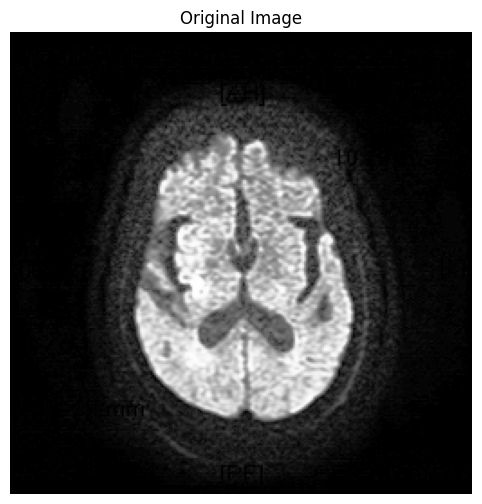

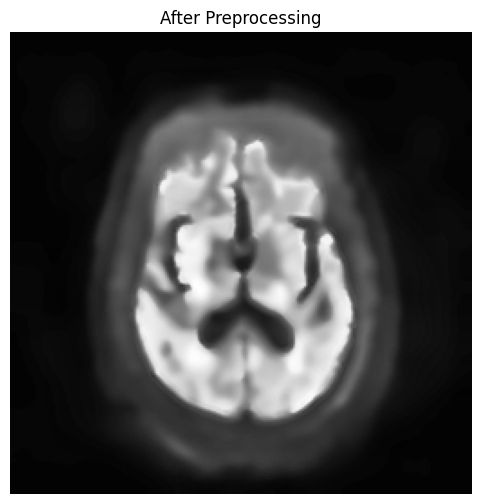

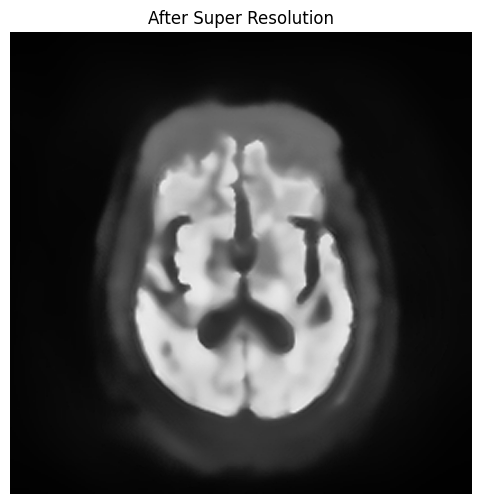

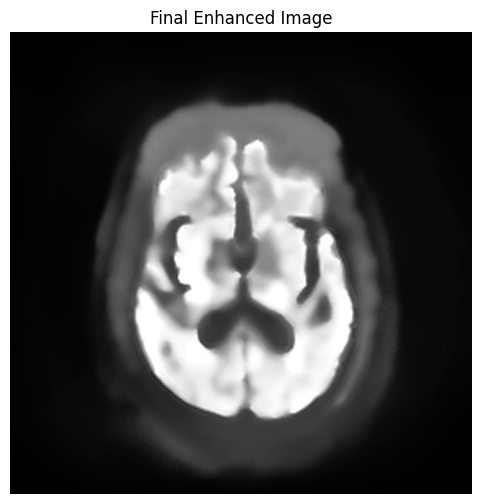

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Amina DWI-16.jpg_Ischemic_21.png

Processing: Amina DWI-17.jpg_Ischemic_22.png


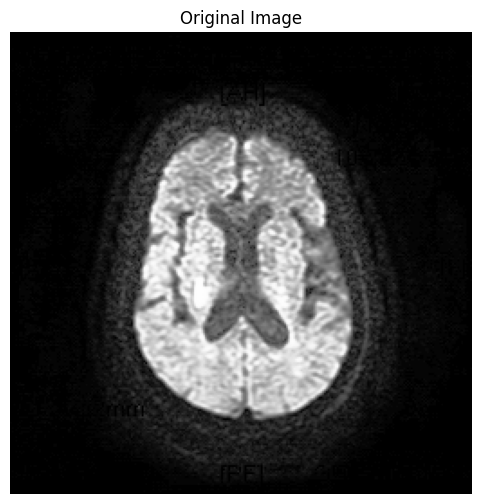

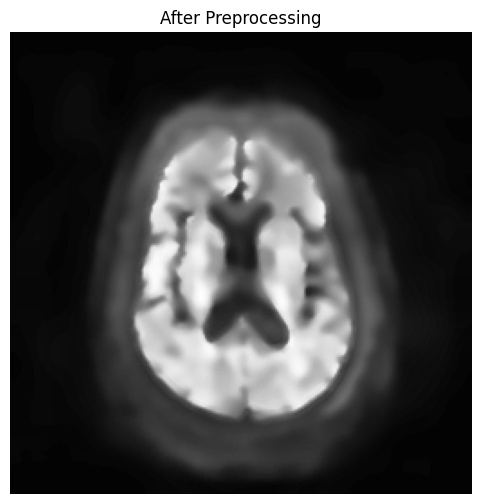

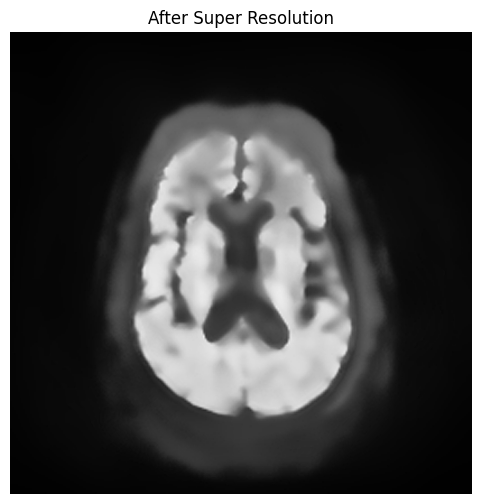

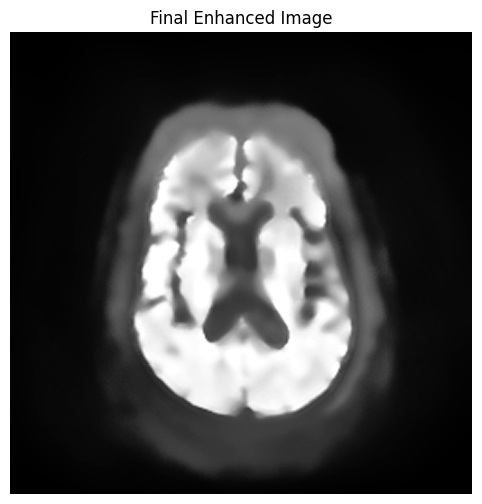

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Amina DWI-17.jpg_Ischemic_22.png

Processing: Amina DWI-18.jpg_Ischemic_23.png


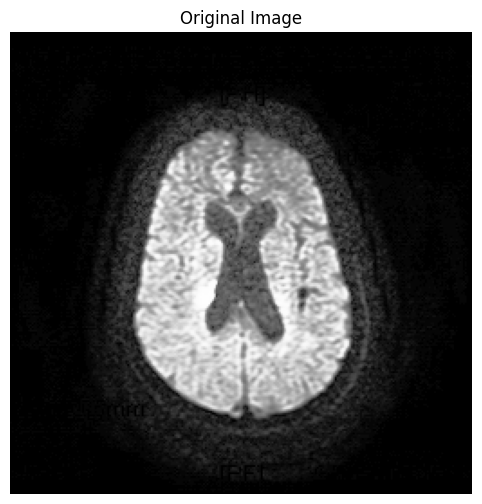

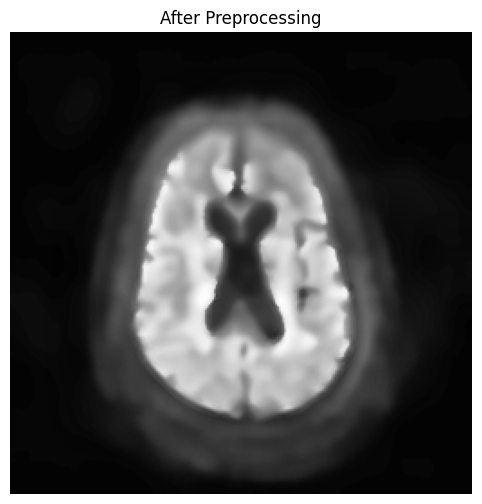

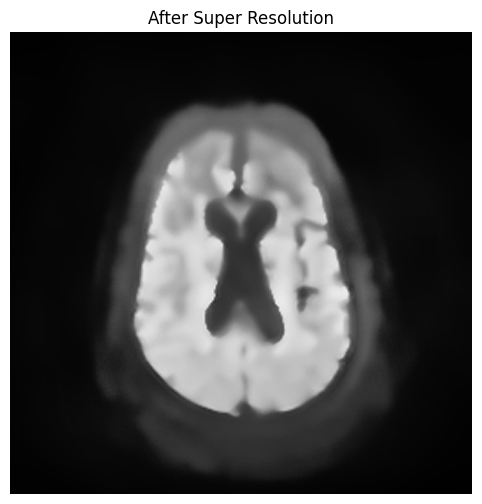

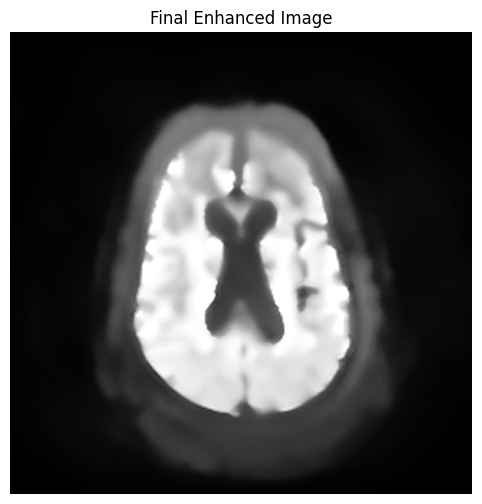

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Amina DWI-18.jpg_Ischemic_23.png

Processing: Anbazhagan DWI-22.jpg_Ischemic_27.png


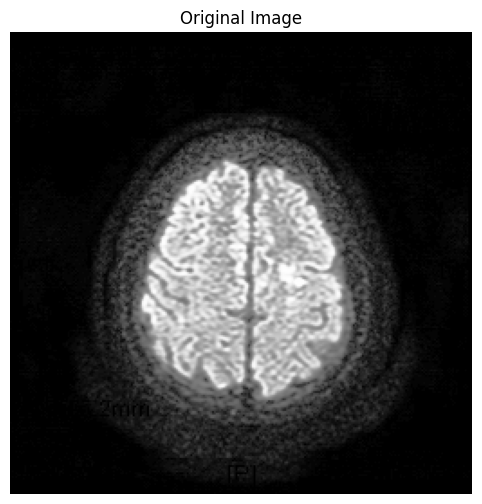

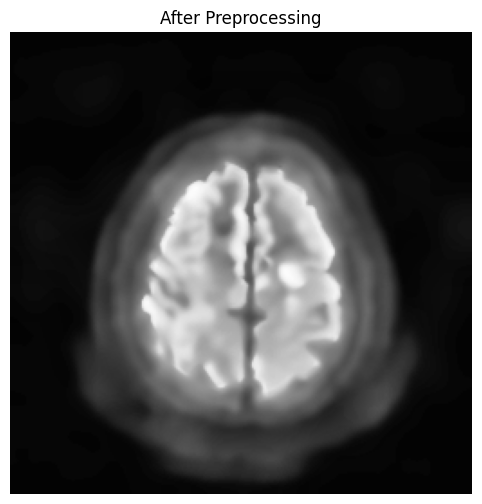

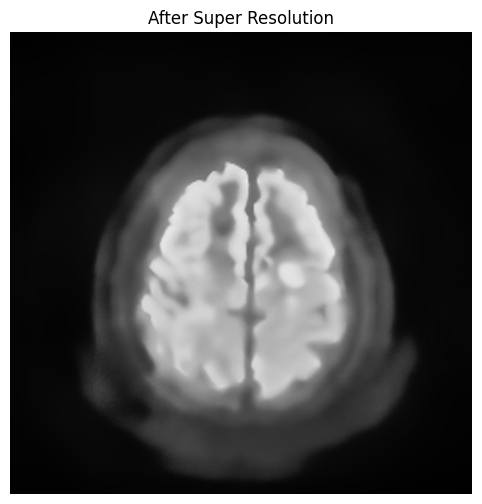

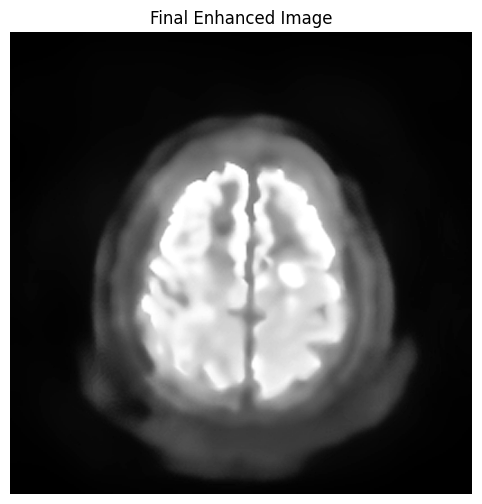

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan DWI-22.jpg_Ischemic_27.png

Processing: Anbazhagan DWI-23.jpg_Ischemic_26.png


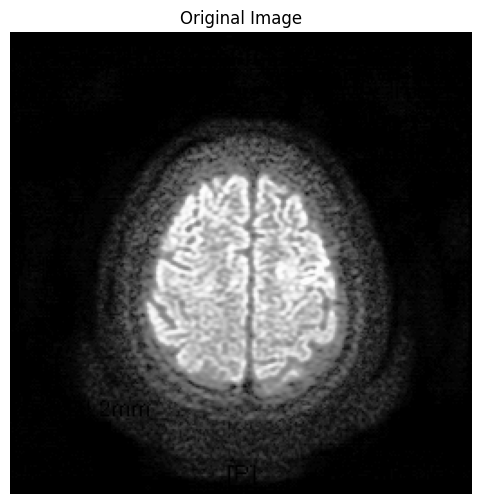

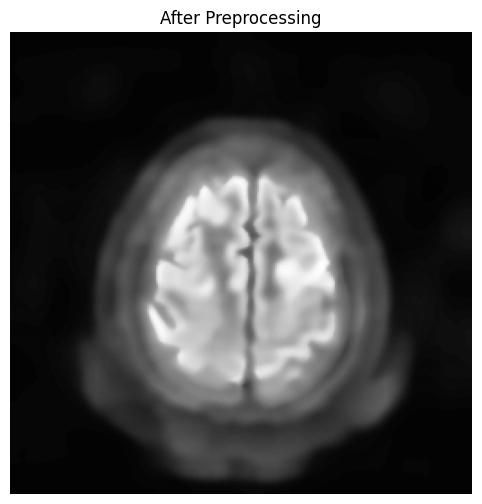

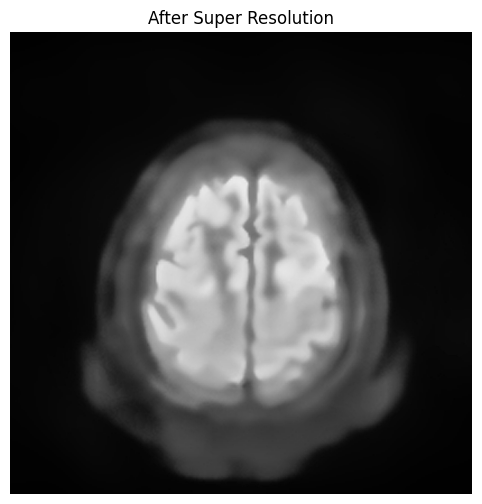

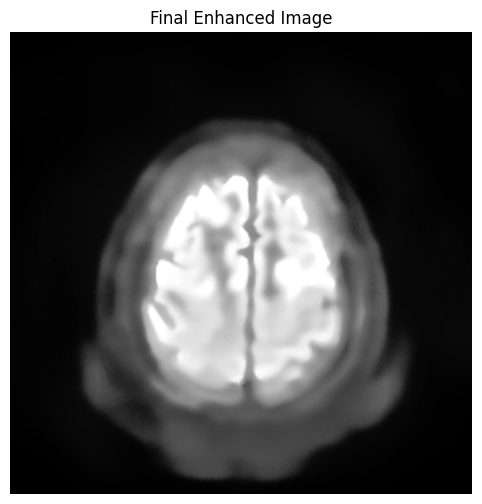

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan DWI-23.jpg_Ischemic_26.png

Processing: Anbazhagan DWI-24.jpg_Ischemic_24.png


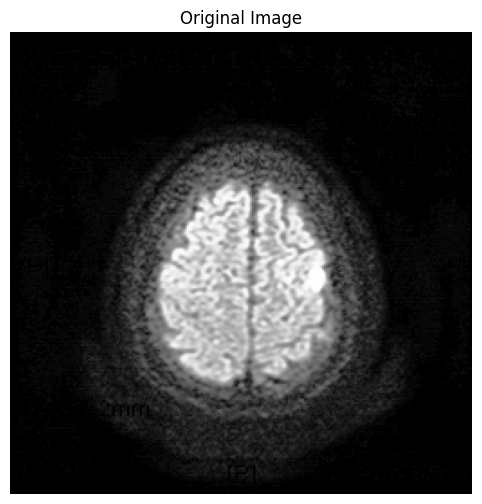

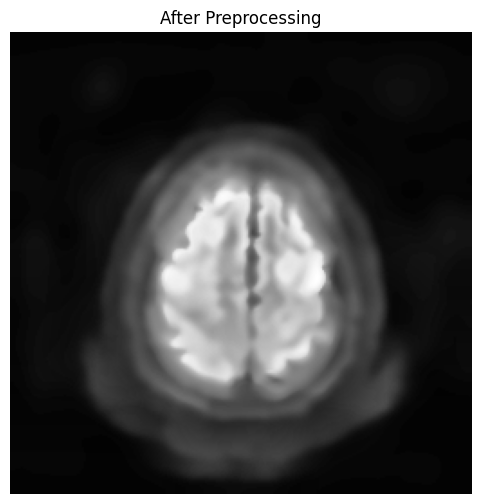

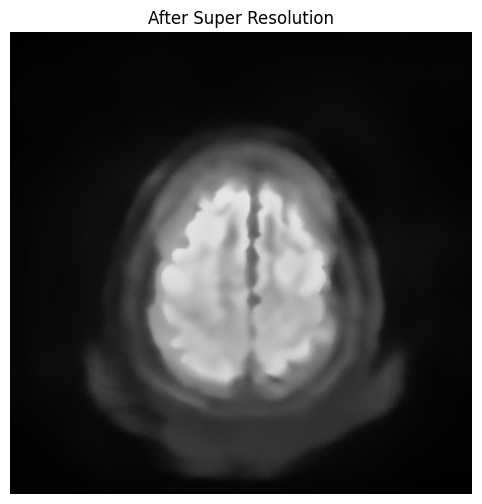

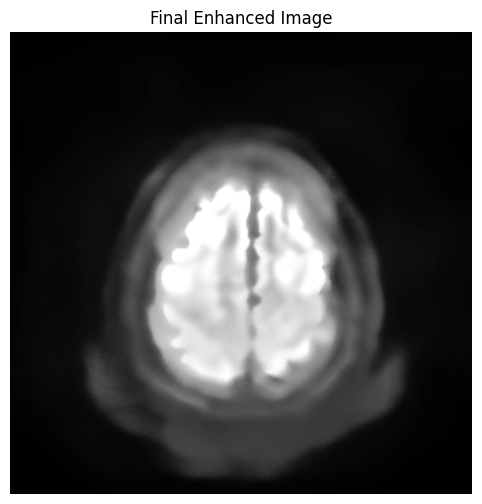

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan DWI-24.jpg_Ischemic_24.png

Processing: Anbazhagan DWI-25.jpg_Ischemic_25.png


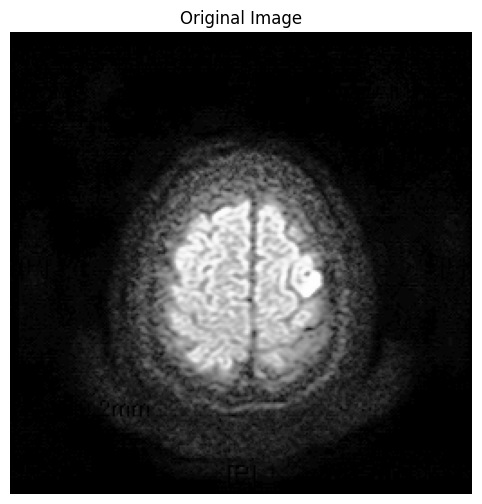

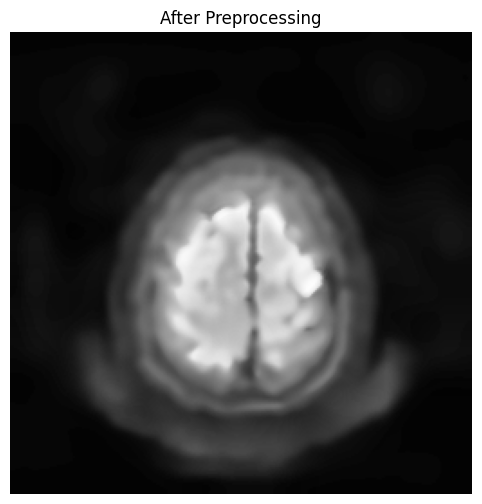

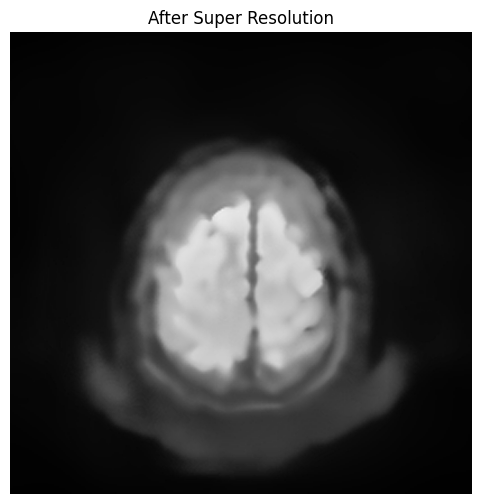

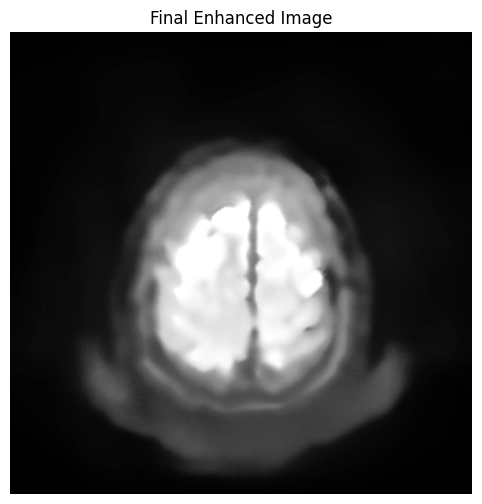

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan DWI-25.jpg_Ischemic_25.png

Processing: Anbazhagan T2-11.jpg_Ischemic_28.png


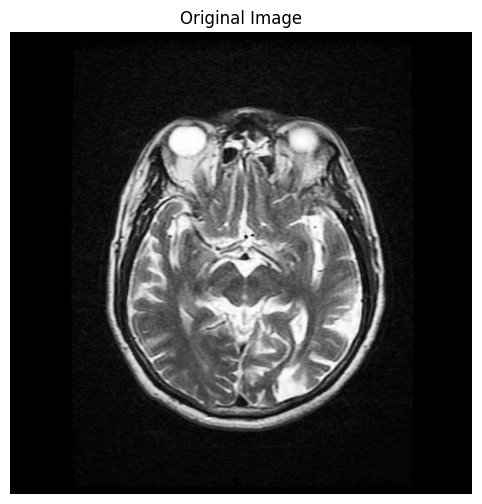

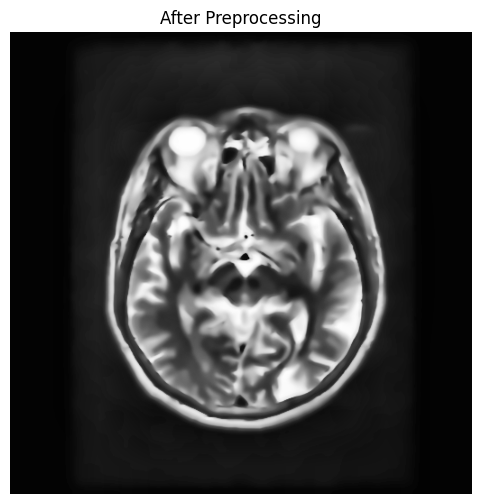

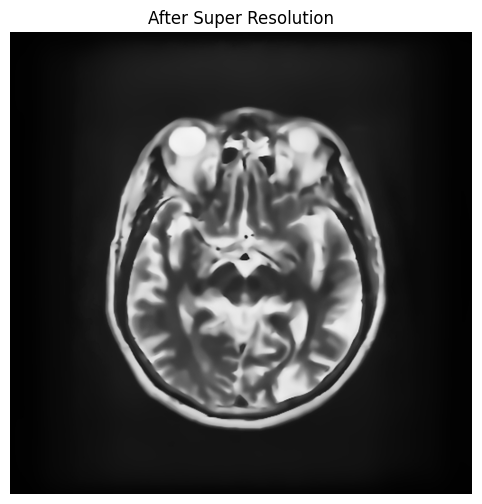

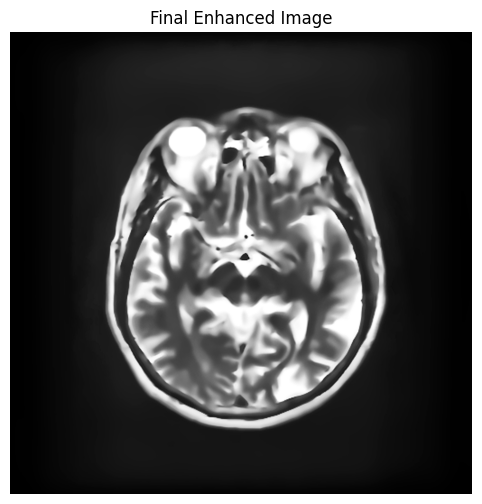

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan T2-11.jpg_Ischemic_28.png

Processing: Anbazhagan T2-12.jpg_Ischemic_29.png


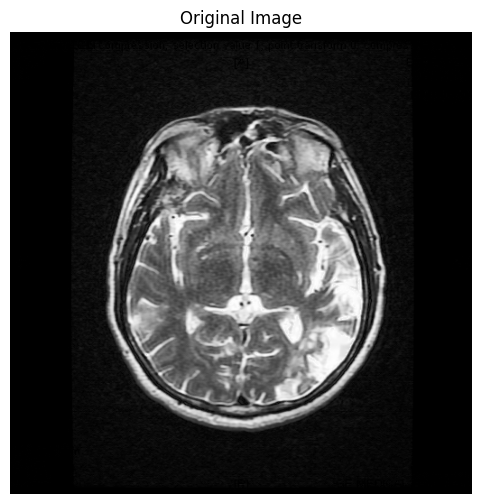

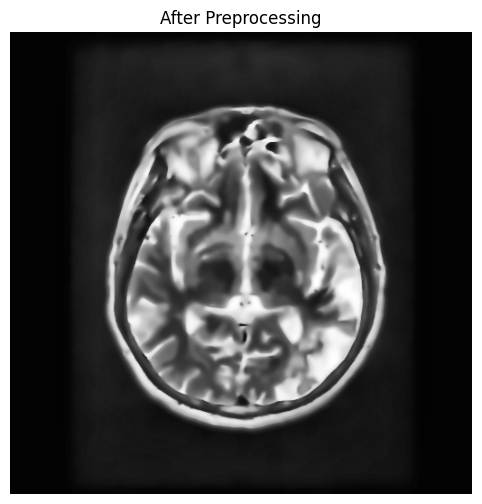

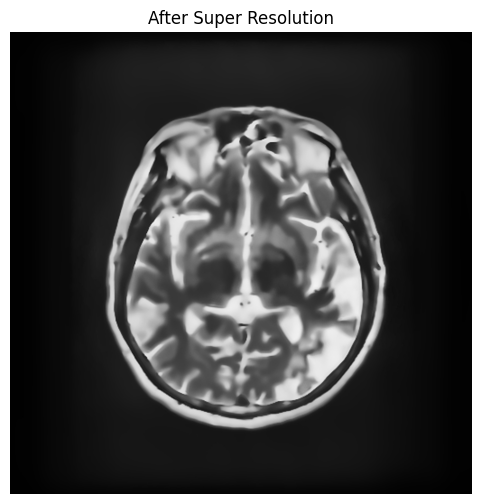

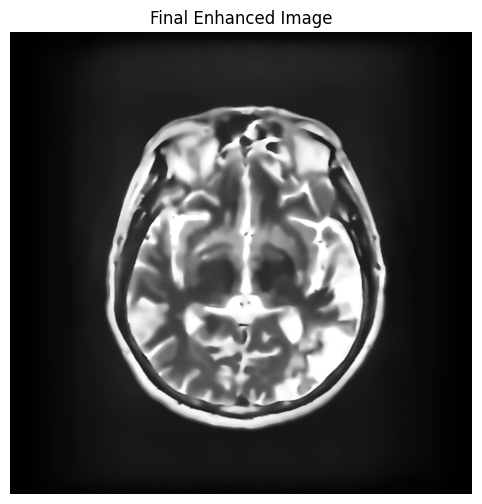

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan T2-12.jpg_Ischemic_29.png

Processing: Anbazhagan T2-13.jpg_Ischemic_30.png


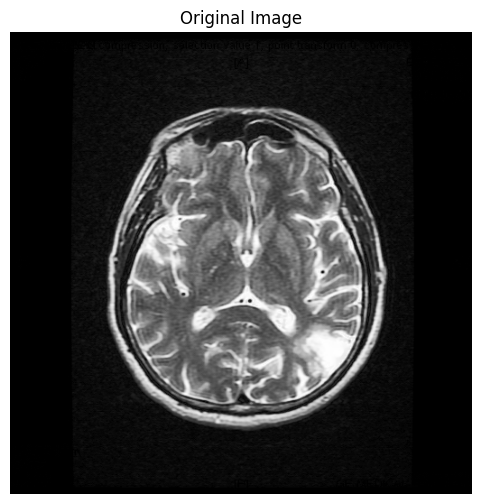

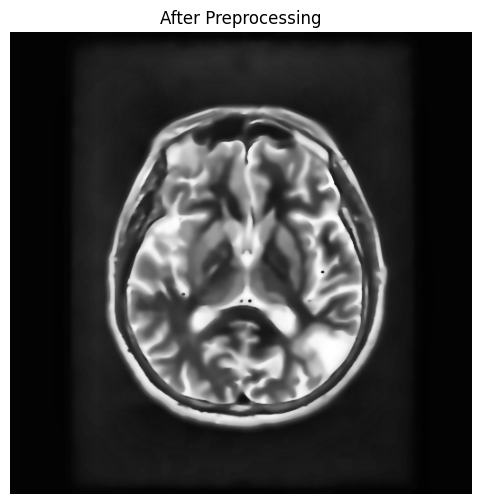

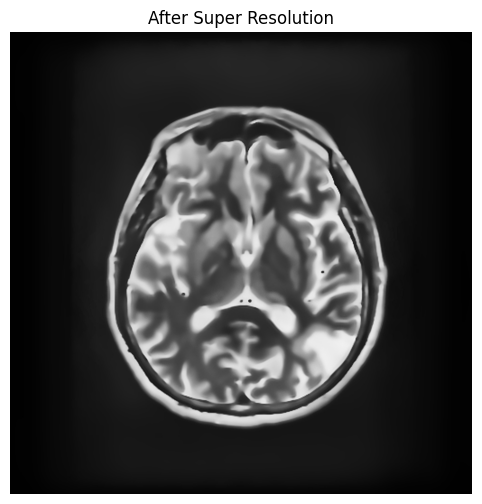

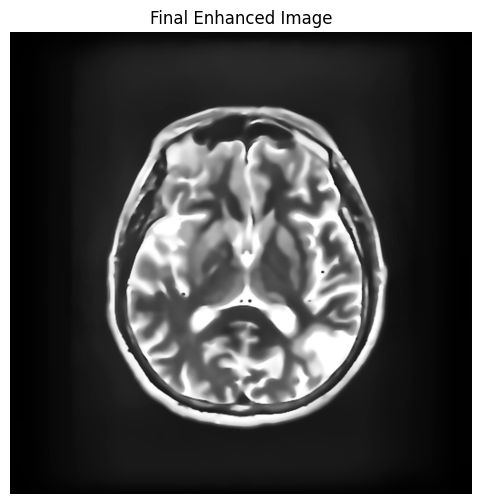

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Anbazhagan T2-13.jpg_Ischemic_30.png

Processing: Ellappan DWI-16.jpg_Ischemic_1.png


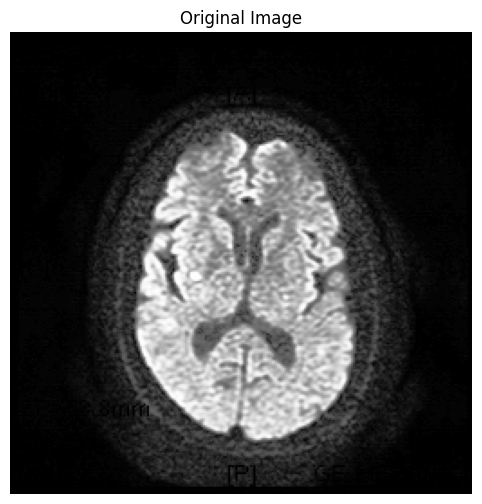

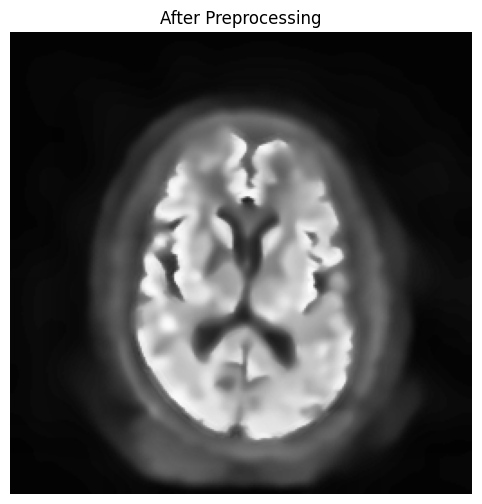

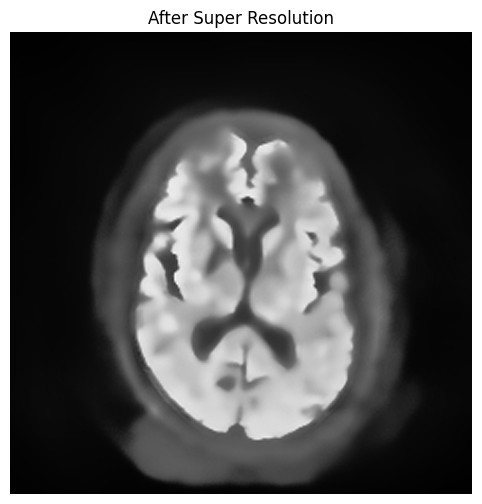

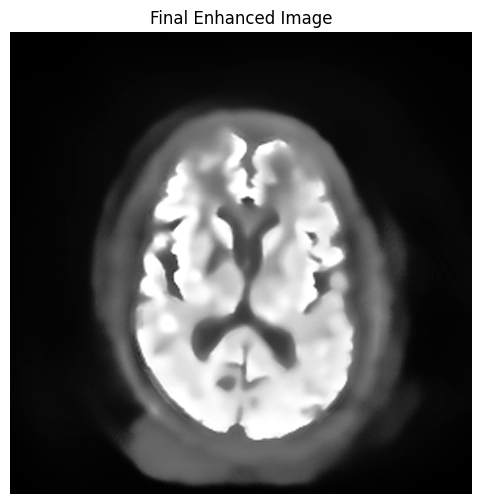

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan DWI-16.jpg_Ischemic_1.png

Processing: Ellappan DWI-17.jpg_Ischemic_2.png


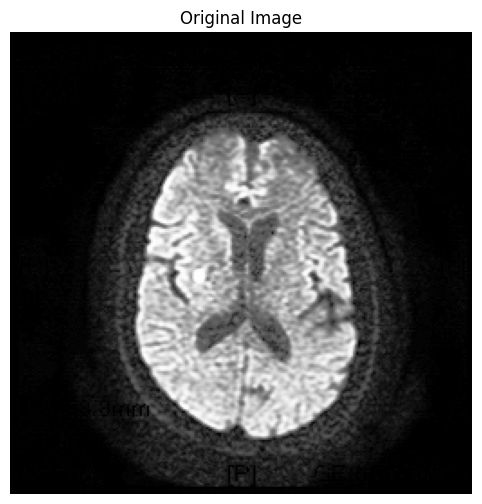

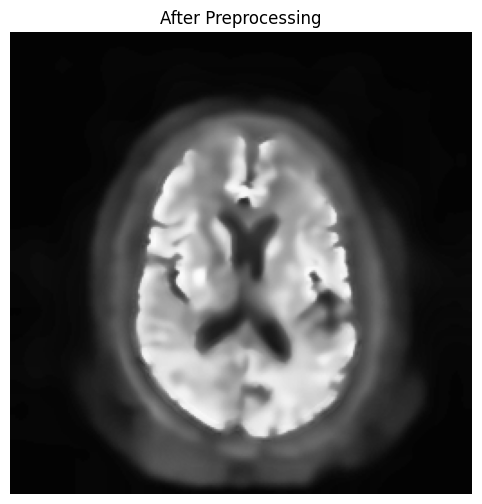

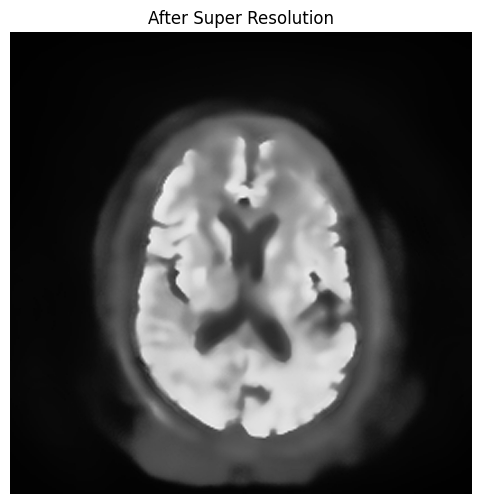

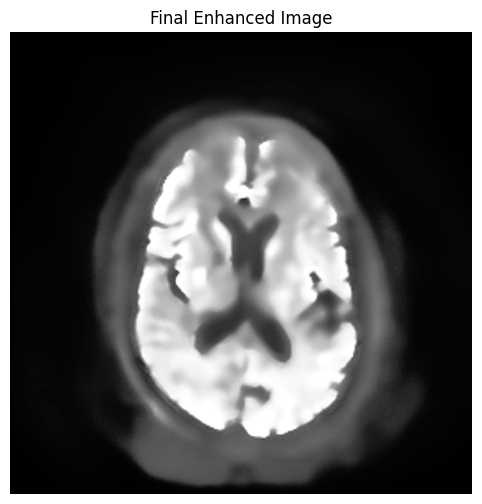

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan DWI-17.jpg_Ischemic_2.png

Processing: Ellappan DWI-18.jpg_Ischemic_3.png


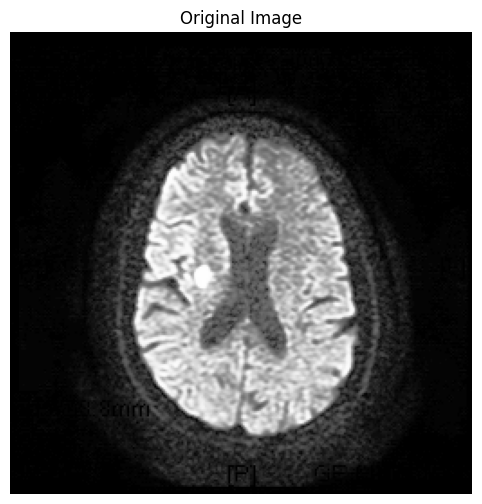

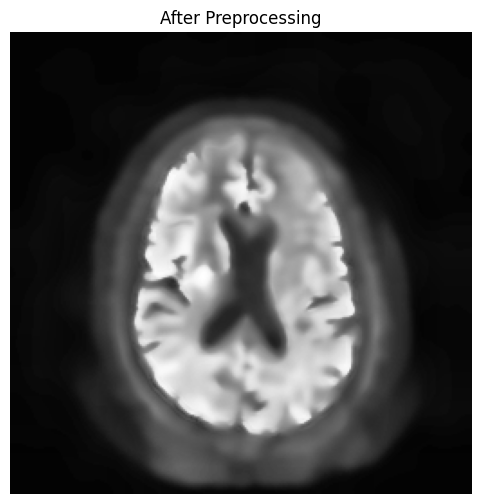

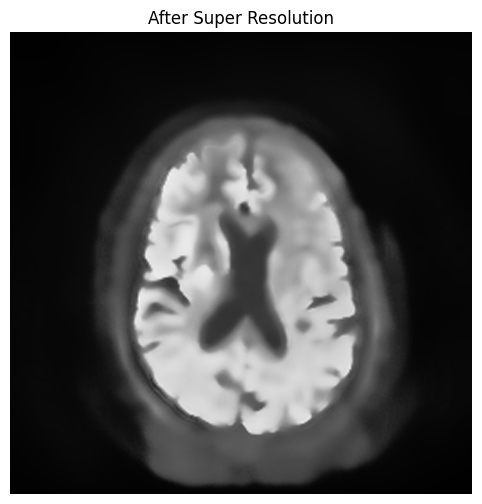

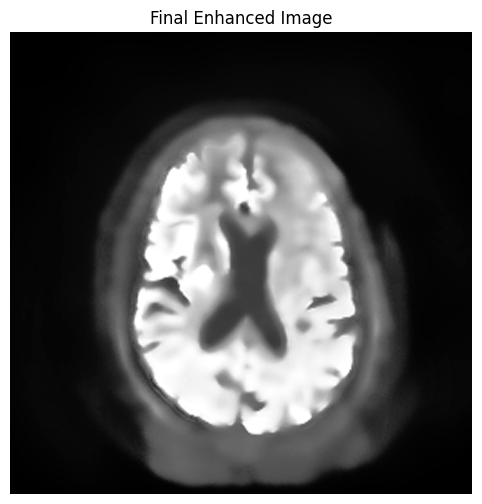

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan DWI-18.jpg_Ischemic_3.png

Processing: Ellappan DWI-19.jpg_Ischemic_4.png


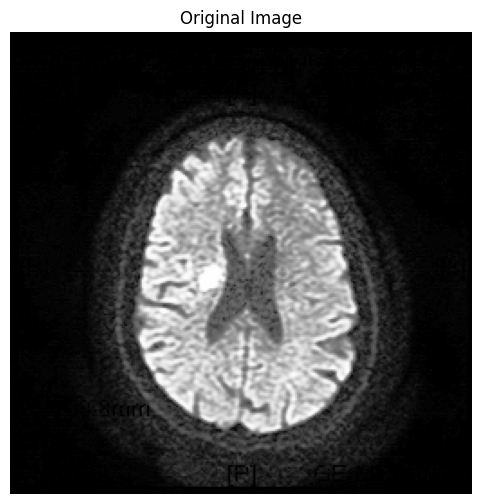

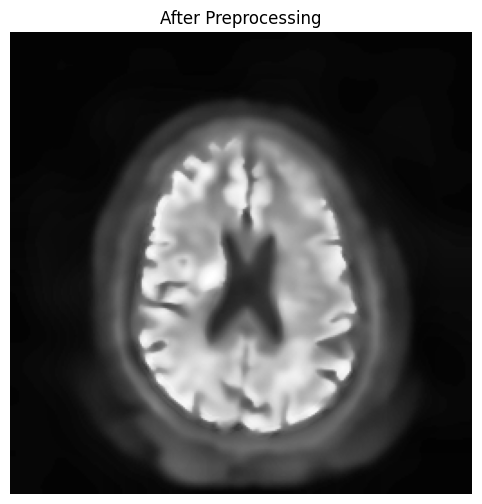

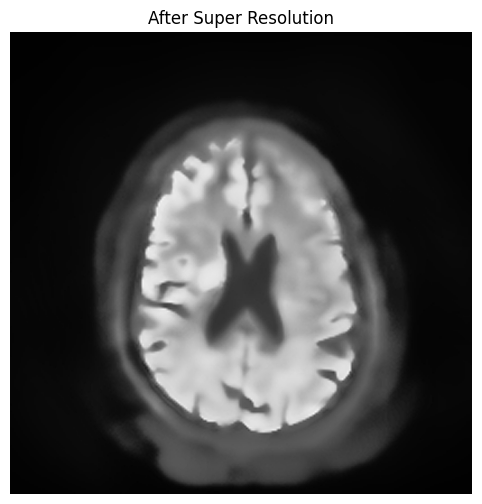

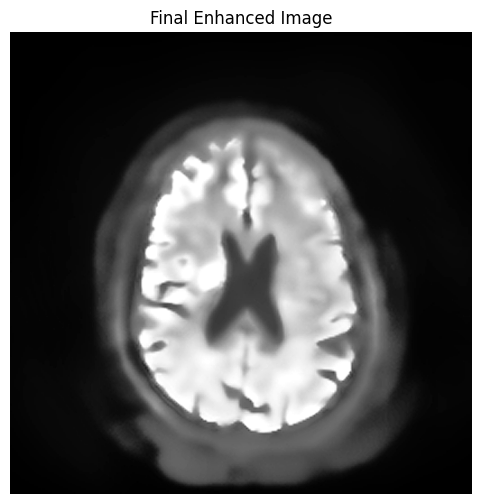

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan DWI-19.jpg_Ischemic_4.png

Processing: Ellappan DWI-20.jpg_Ischemic_5.png


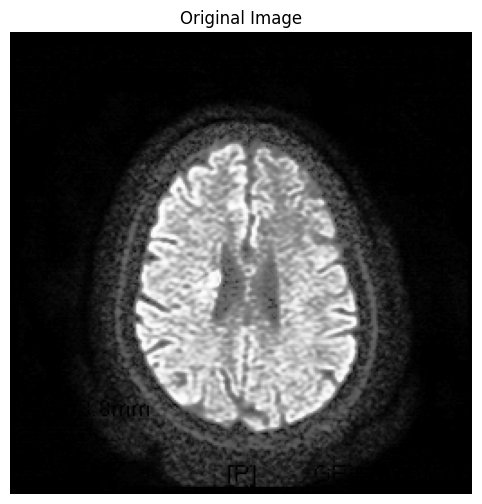

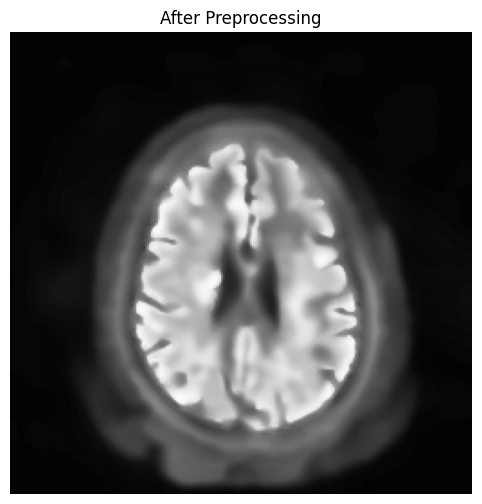

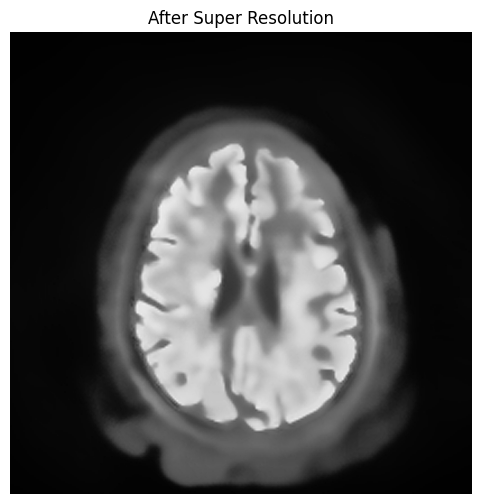

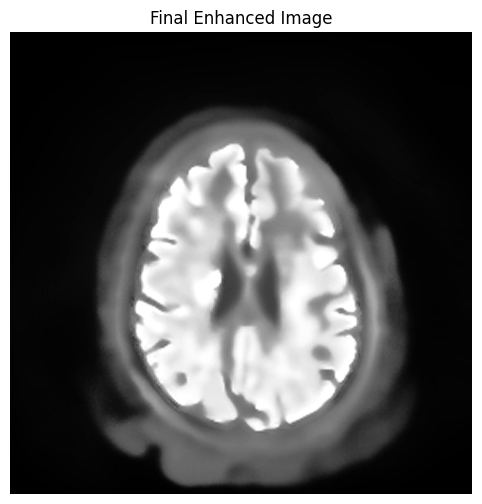

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan DWI-20.jpg_Ischemic_5.png

Processing: Ellappan T2 Flair-11.jpg_Ischemic_6.png


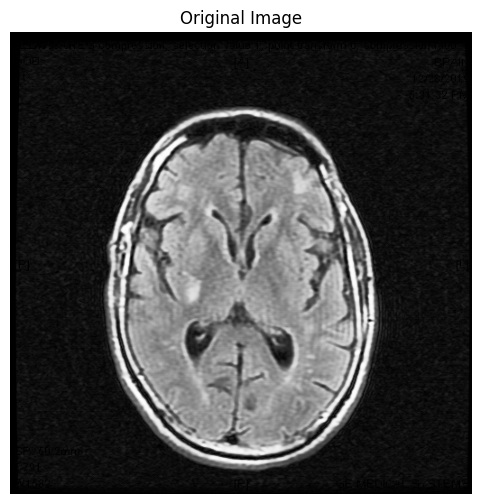

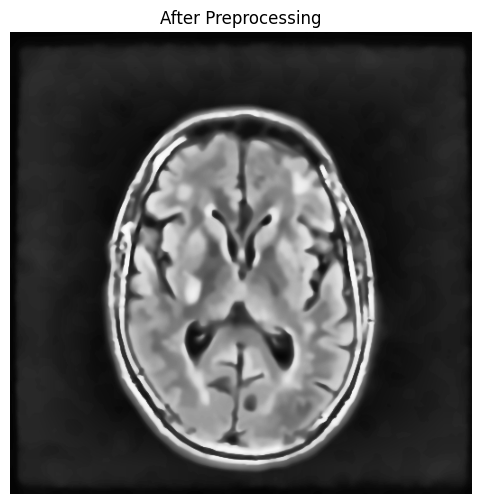

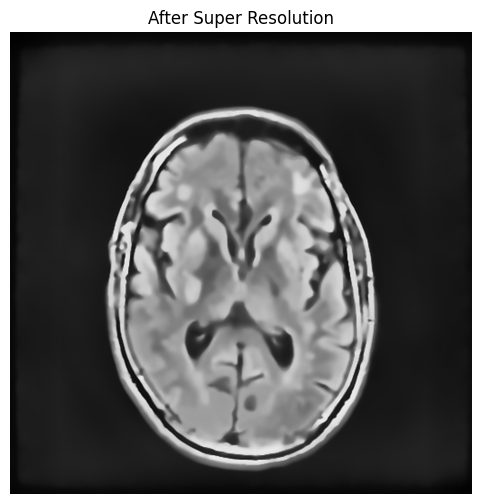

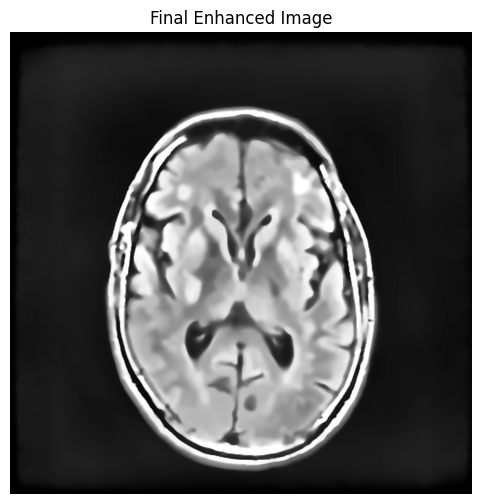

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan T2 Flair-11.jpg_Ischemic_6.png

Processing: Ellappan T2 Flair-12.jpg_Ischemic_7.png


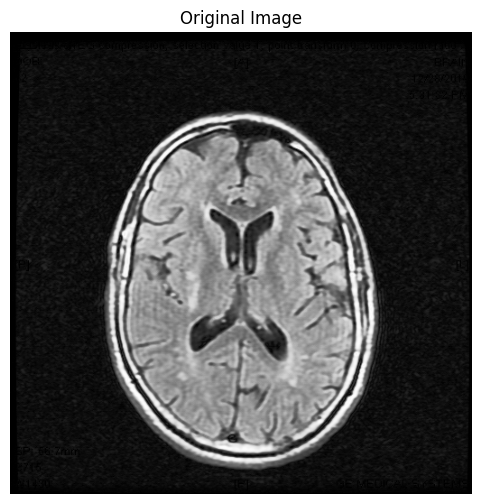

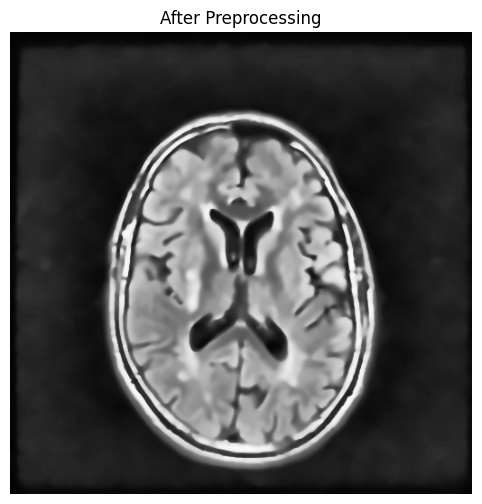

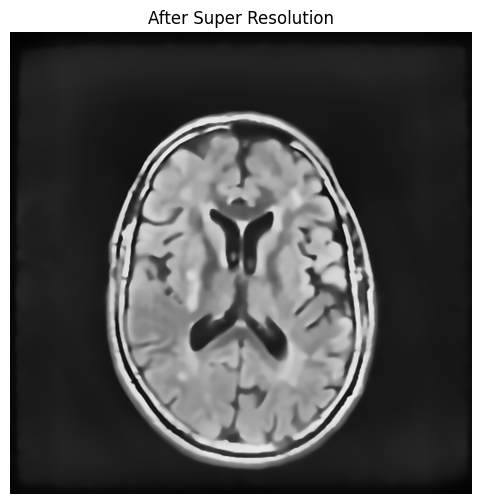

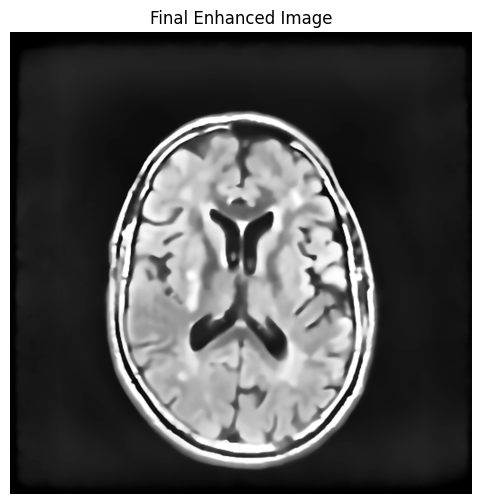

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan T2 Flair-12.jpg_Ischemic_7.png

Processing: Ellappan T2 Flair-13.jpg_Ischemic_8.png


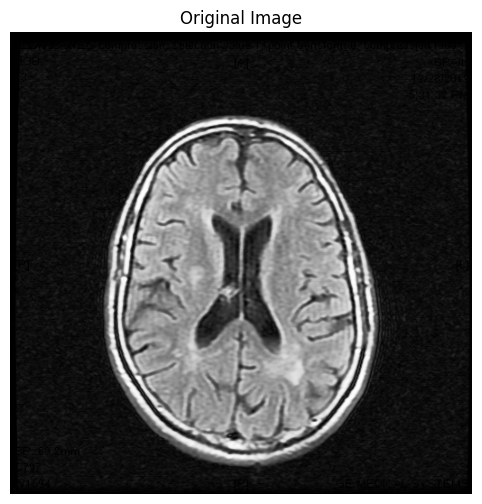

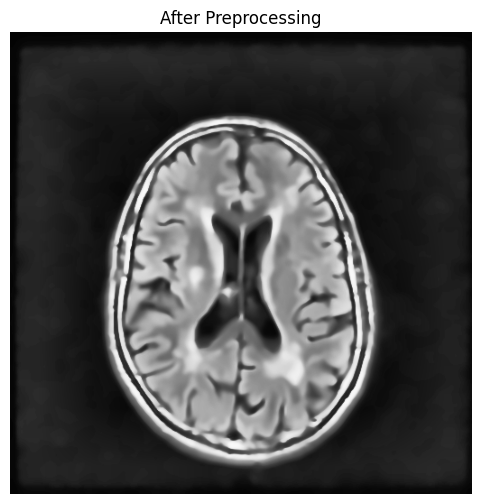

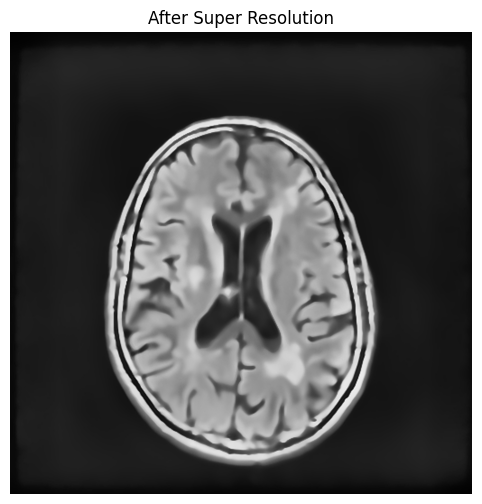

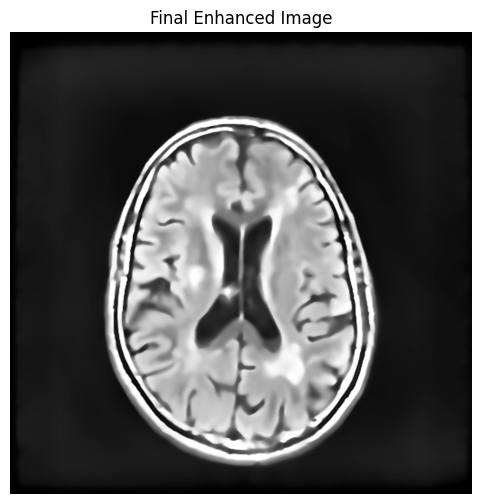

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan T2 Flair-13.jpg_Ischemic_8.png

Processing: Ellappan T2-11.jpg_Ischemic_9.png


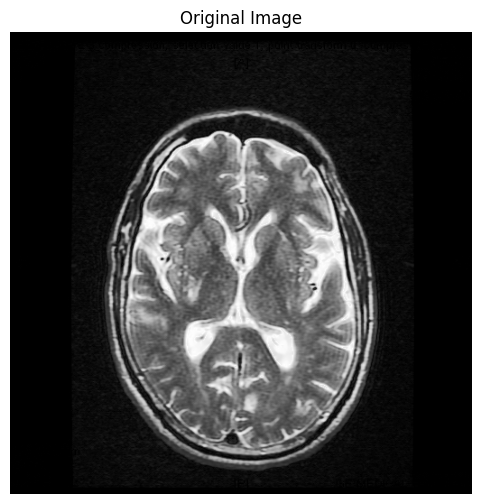

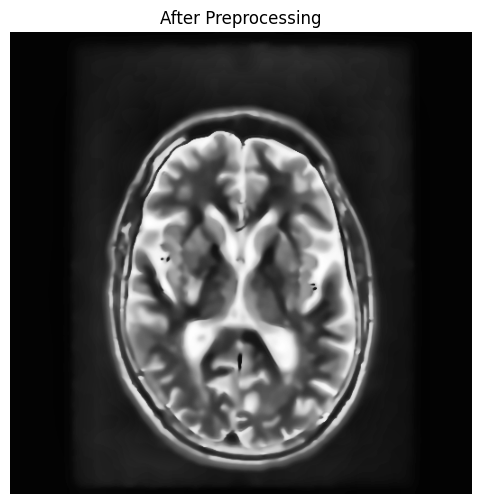

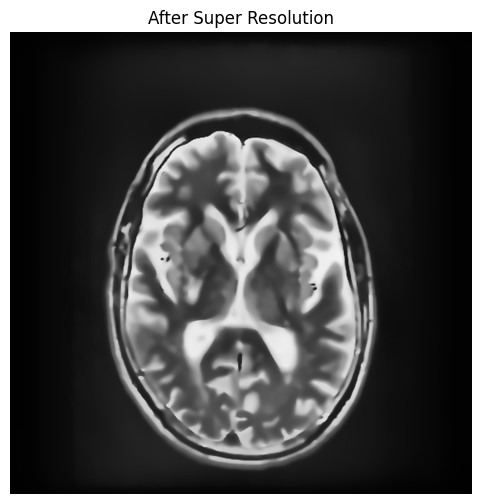

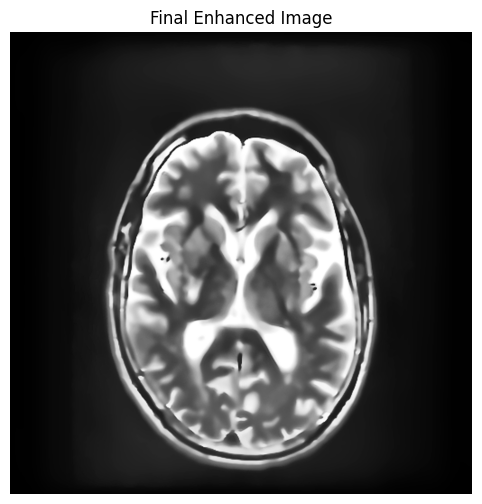

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan T2-11.jpg_Ischemic_9.png

Processing: Ellappan T2-12.jpg_Ischemic_10.png


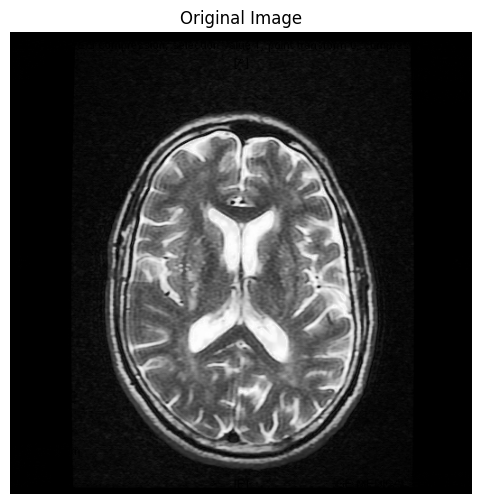

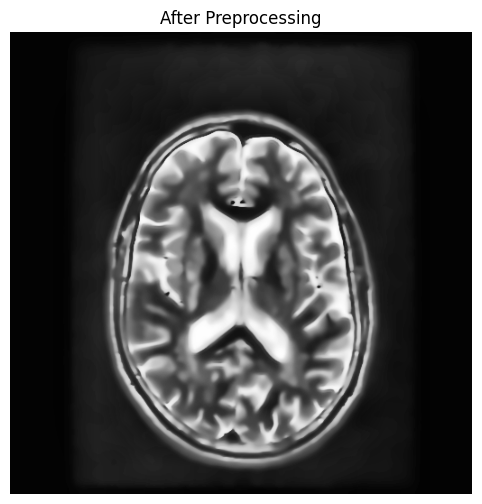

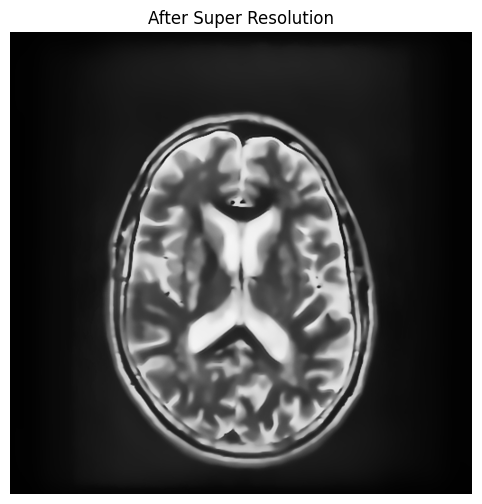

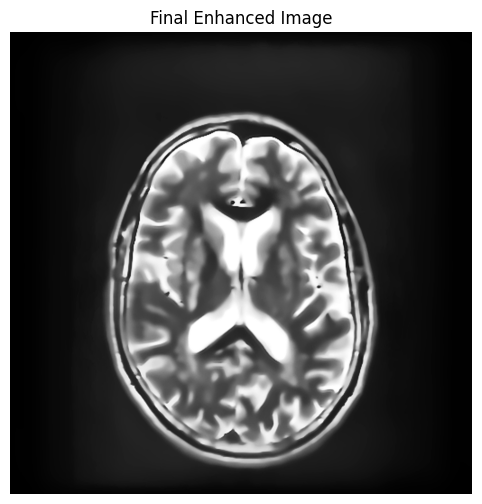

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan T2-12.jpg_Ischemic_10.png

Processing: Ellappan T2-13.jpg_Ischemic_11.png


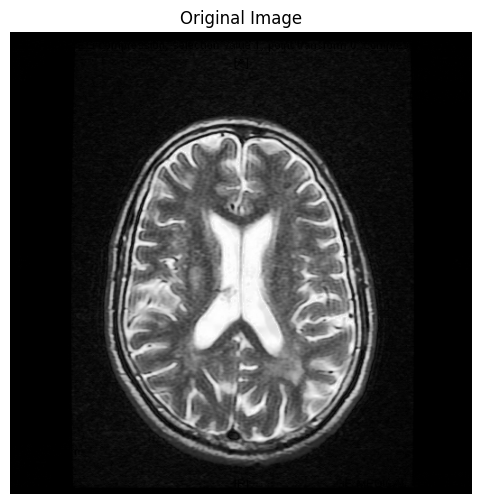

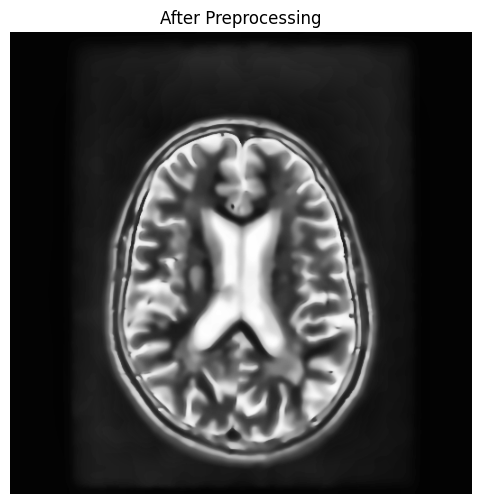

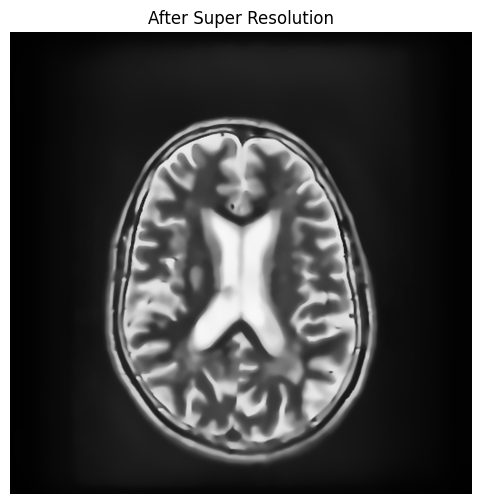

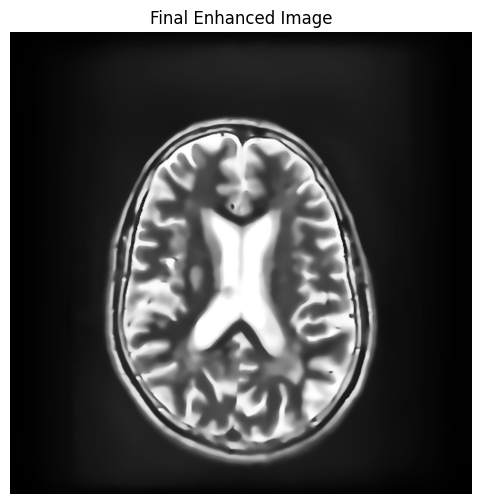

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ellappan T2-13.jpg_Ischemic_11.png

Processing: Gangapushbam DWI-22.jpg_Ischemic_12.png


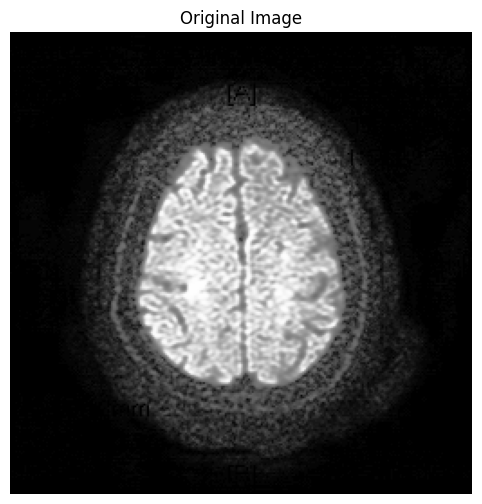

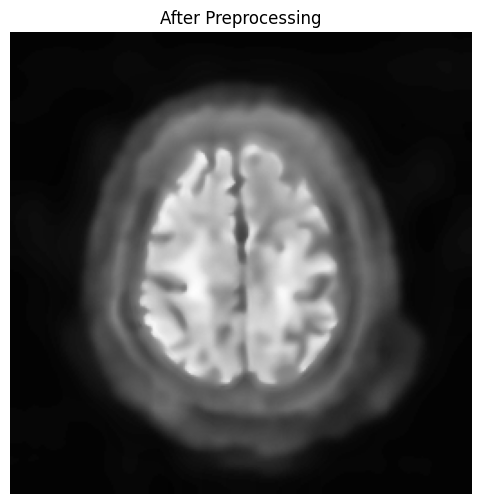

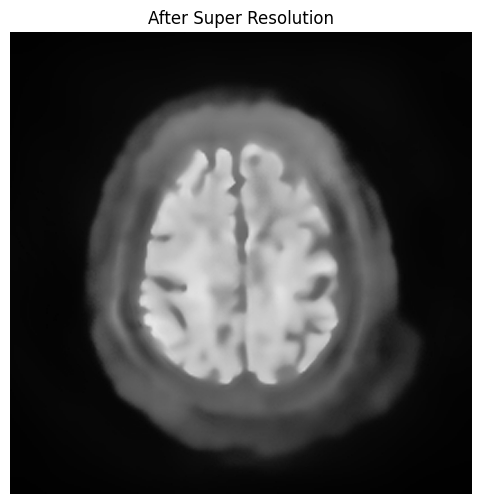

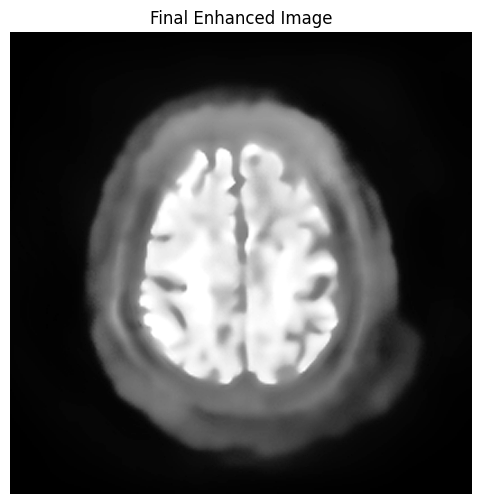

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Gangapushbam DWI-22.jpg_Ischemic_12.png

Processing: Gangapushbam DWI-23.jpg_Ischemic_13.png


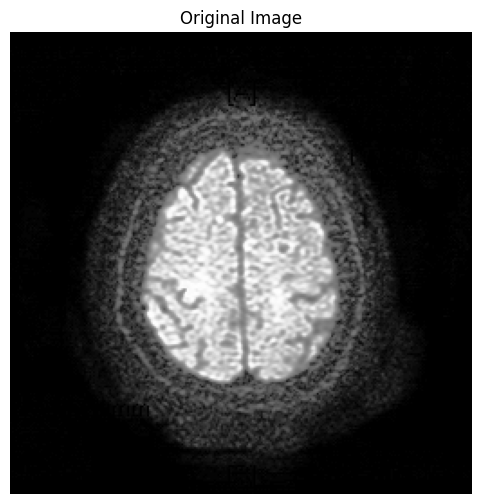

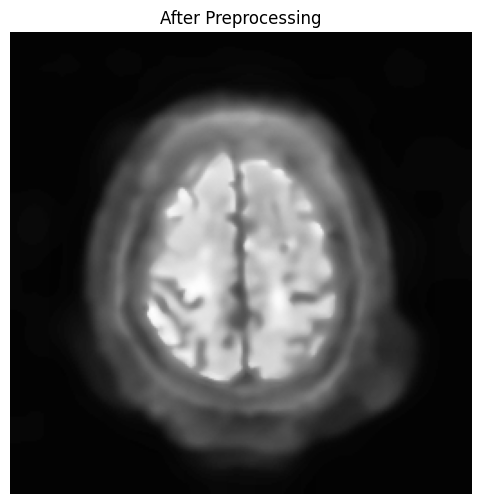

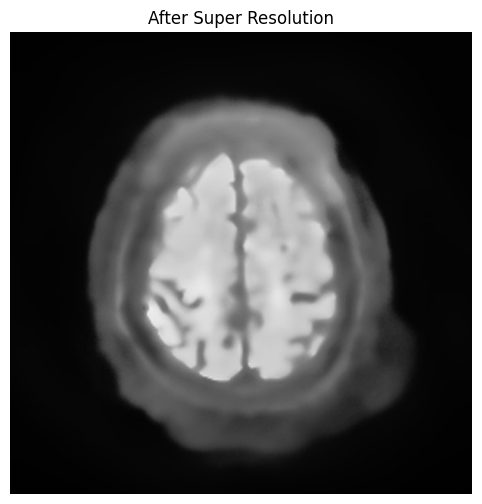

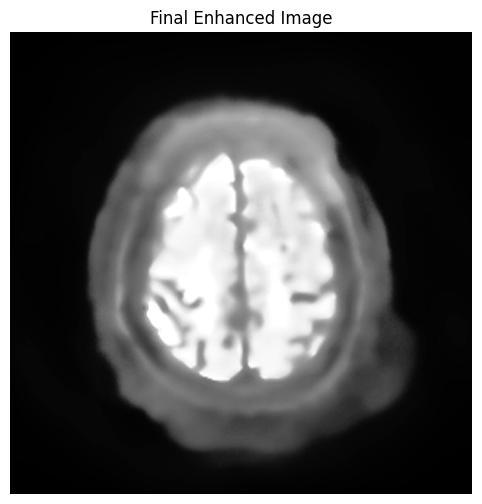

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Gangapushbam DWI-23.jpg_Ischemic_13.png

Processing: Gangapushbam DWI-24.jpg_Ischemic_16.png


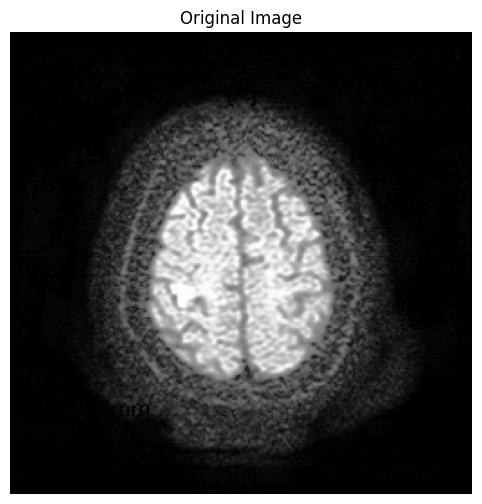

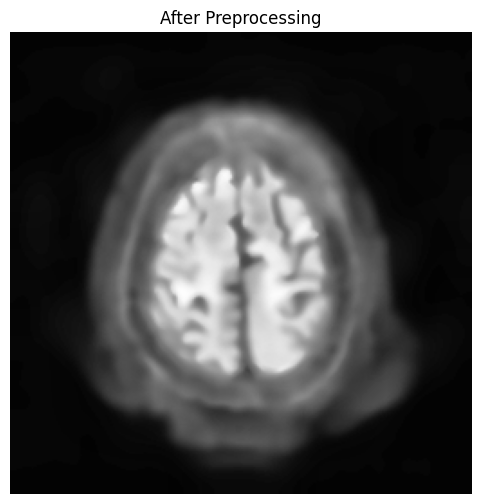

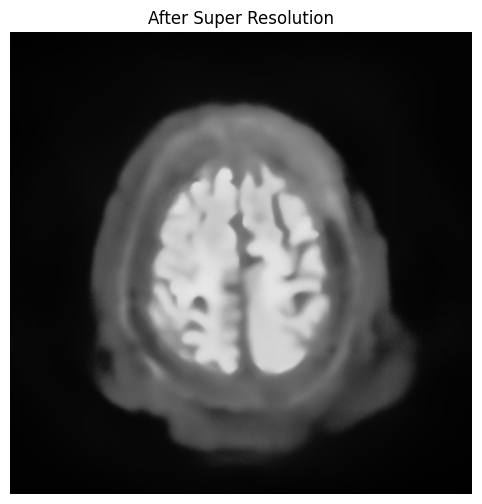

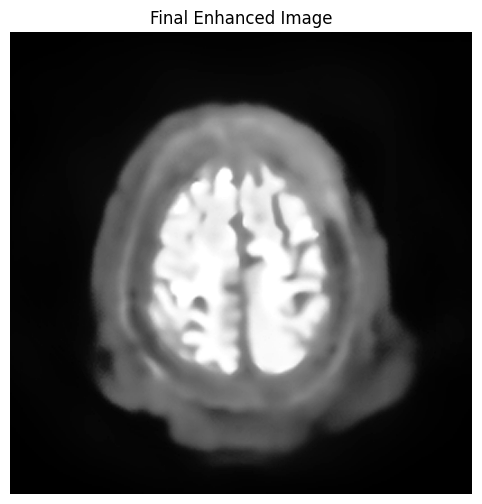

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Gangapushbam DWI-24.jpg_Ischemic_16.png

Processing: Gangapushbam DWI-25.jpg_Ischemic_15.png


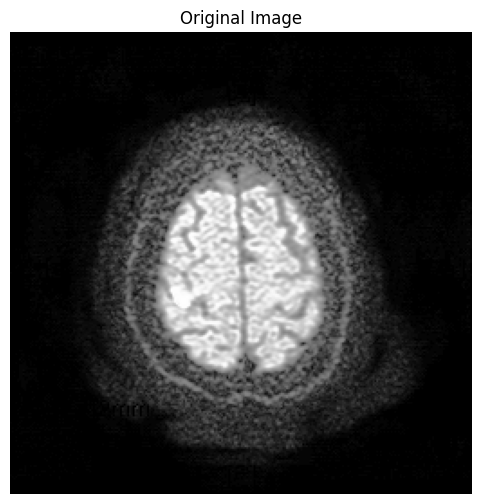

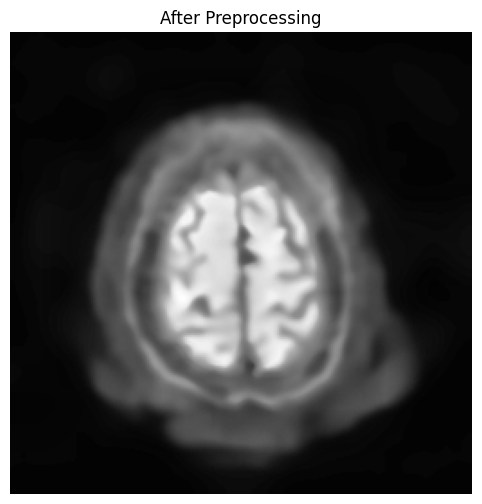

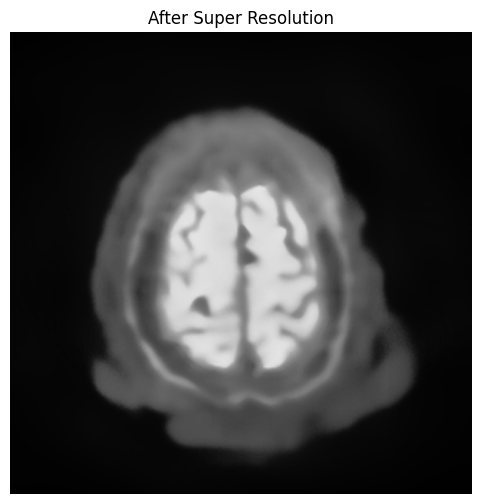

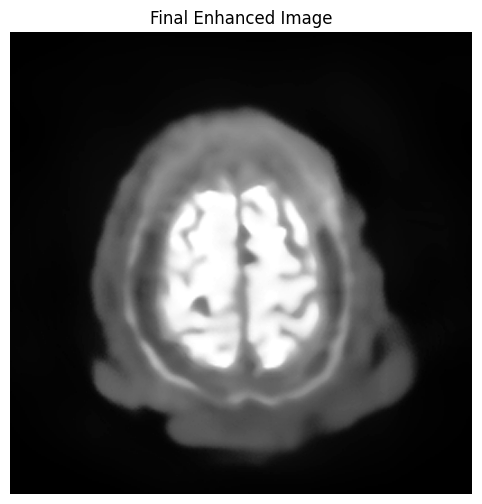

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Gangapushbam DWI-25.jpg_Ischemic_15.png

Processing: Gangapushbam DWI-26.jpg_Ischemic_14.png


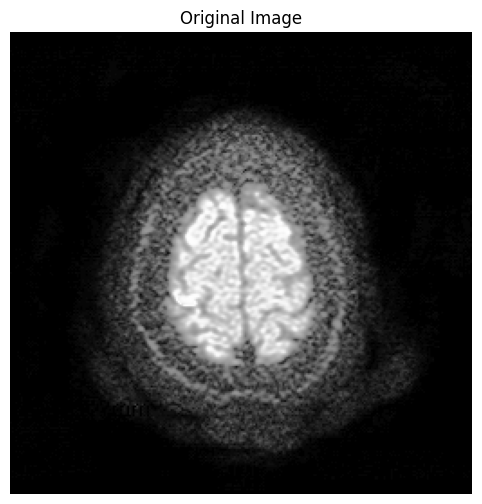

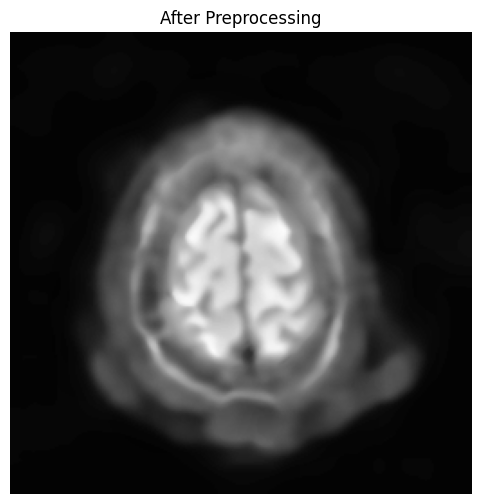

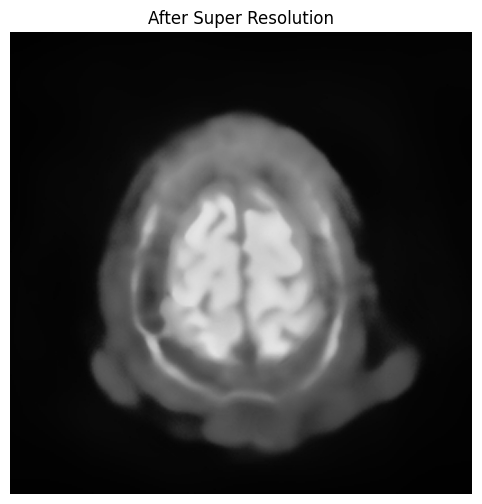

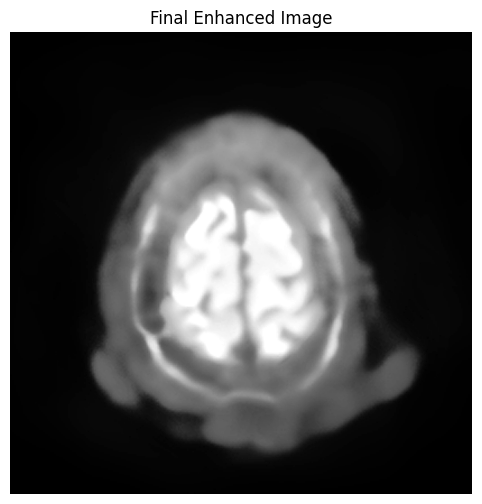

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Gangapushbam DWI-26.jpg_Ischemic_14.png

Processing: Ramachandran DWI-19.jpg_Ischemic_20.png


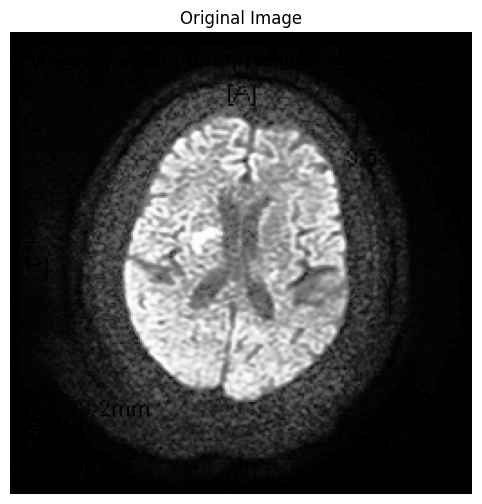

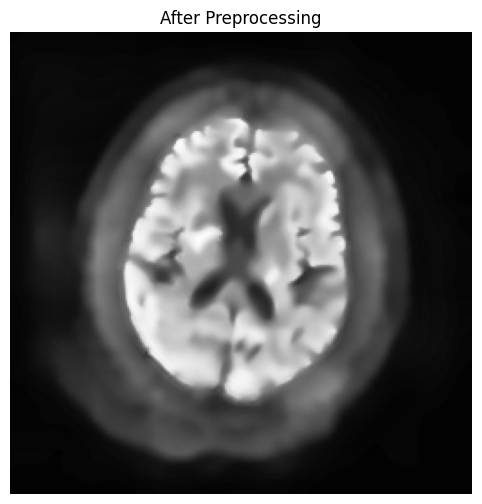

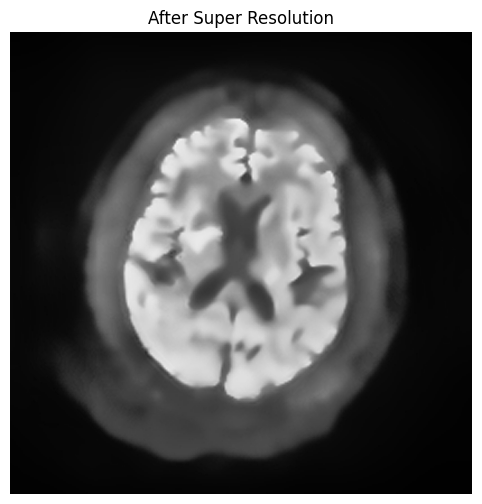

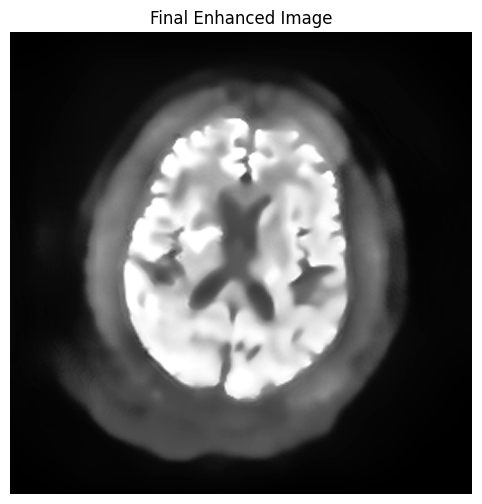

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ramachandran DWI-19.jpg_Ischemic_20.png

Processing: Ramachandran DWI-20.jpg_Ischemic_19.png


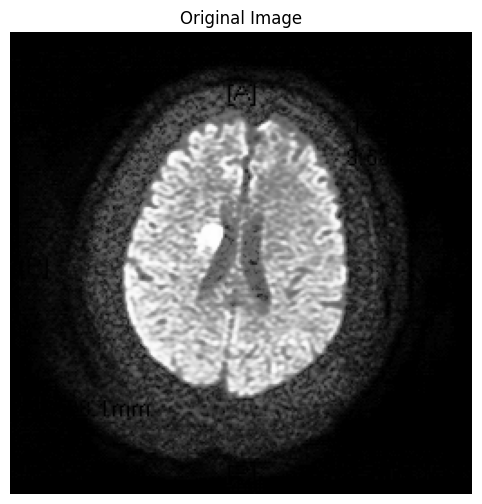

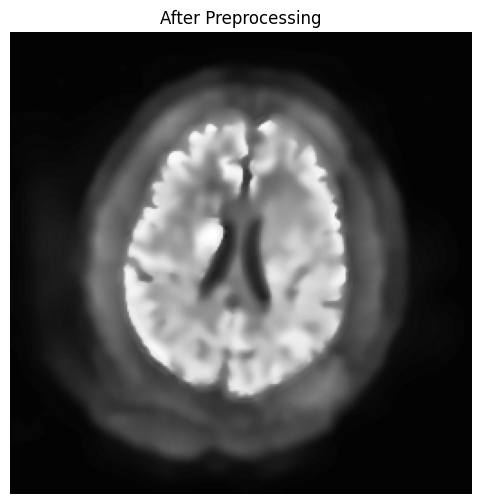

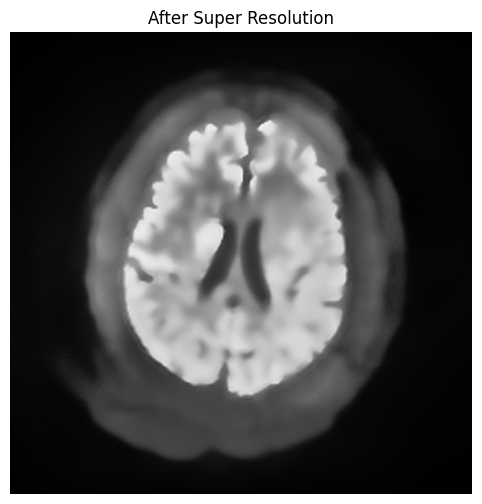

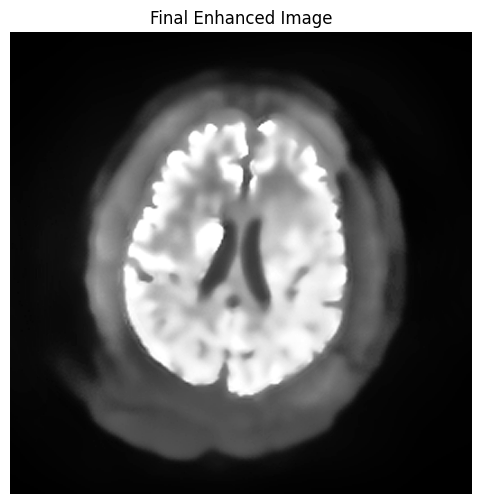

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ramachandran DWI-20.jpg_Ischemic_19.png

Processing: Ramachandran T2 Flair-18.jpg_Ischemic_17.png


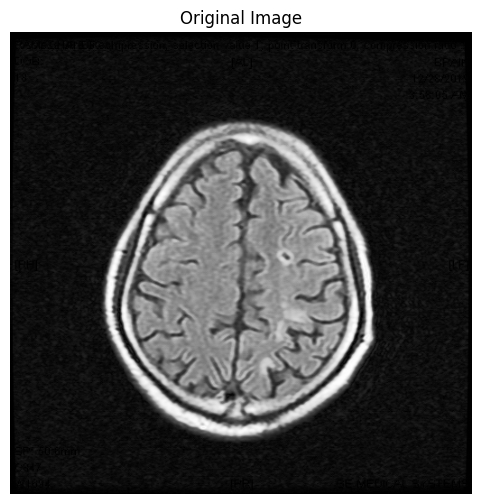

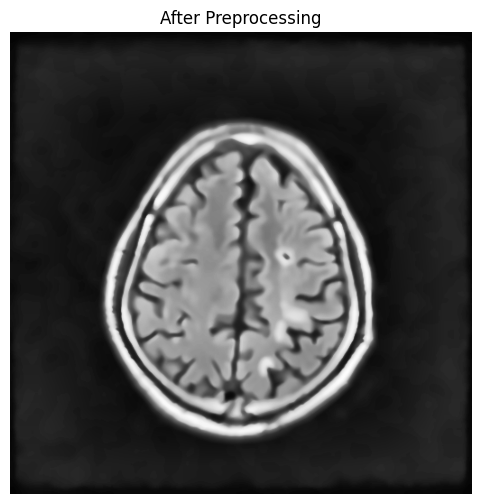

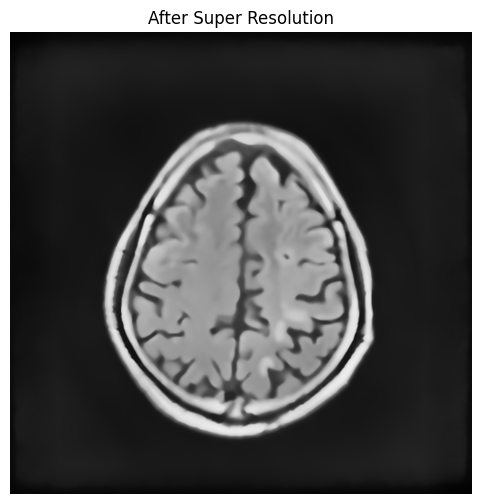

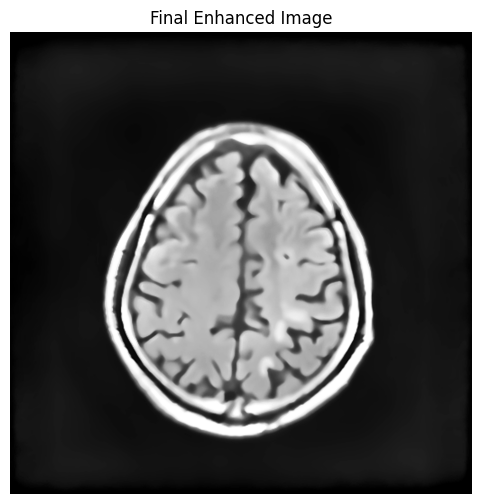

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ramachandran T2 Flair-18.jpg_Ischemic_17.png

Processing: Ramachandran T2 Flair-19.jpg_Ischemic_18.png


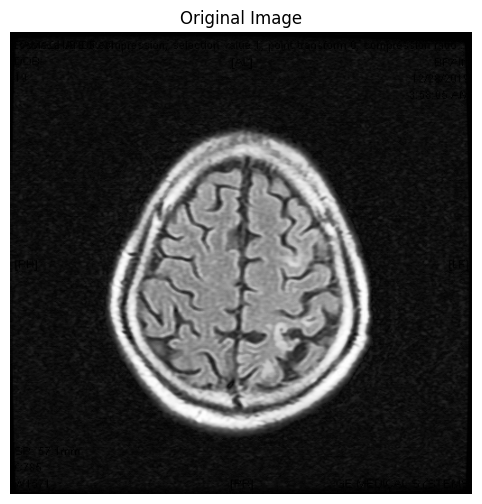

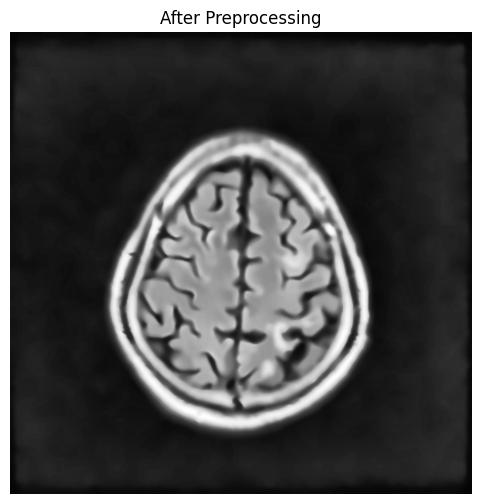

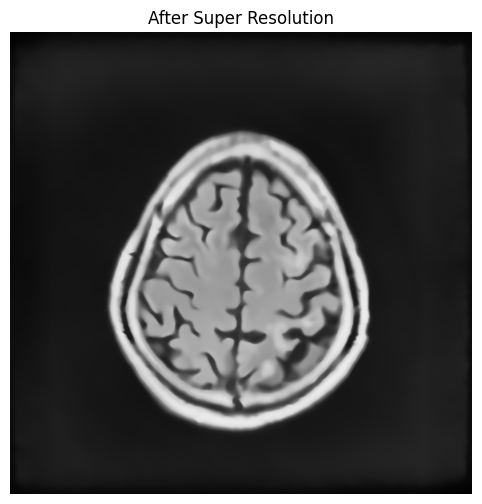

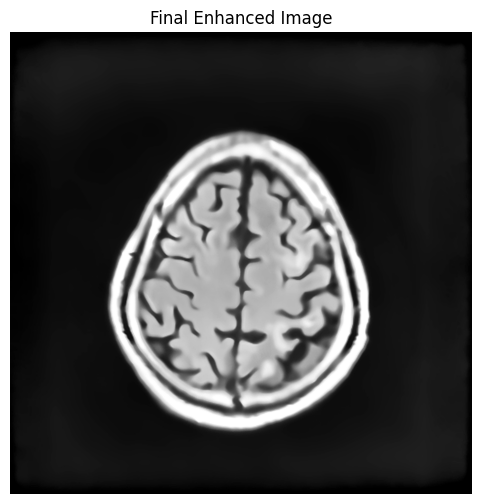

✅ Saved: D:\ehr\Enhanced_Ischemic\enhanced_Ramachandran T2 Flair-19.jpg_Ischemic_18.png



In [7]:
import os
from glob import glob

input_folder = r"D:\ehr\Stroke_classification\Ischemic"
output_folder = r"D:\ehr\Enhanced_Ischemic"
os.makedirs(output_folder, exist_ok=True)

image_files = glob(os.path.join(input_folder, "*.jpg")) + glob(os.path.join(input_folder, "*.png")) + glob(os.path.join(input_folder, "*.jpeg"))

for path in image_files:
    filename = os.path.basename(path)
    output_path = os.path.join(output_folder, f"enhanced_{filename}")
    print(f"Processing: {filename}")
    final = process_image(path, mode='medical', sr_scale=2)
    cv2.imwrite(output_path, cv2.cvtColor(final, cv2.COLOR_RGB2BGR))
    print(f"✅ Saved: {output_path}\n")


In [3]:
import cv2
import numpy as np
from skimage import exposure, img_as_ubyte
from skimage.restoration import denoise_bilateral

def process_image(image_path, mode='prescription', sr_scale=1.5):
    """
    Enhance prescription or medical images.
    mode: 'prescription' or 'medical'
    sr_scale: super-resolution scaling factor
    """
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 1. Contrast enhancement
    img_eq = exposure.equalize_adapthist(img, clip_limit=0.03)
    img_eq = img_as_ubyte(img_eq)

    # 2. Denoising
    img_denoised = denoise_bilateral(img_eq, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)
    img_denoised = img_as_ubyte(img_denoised)

    # 3. Sharpening
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    img_sharp = cv2.filter2D(img_denoised, -1, kernel)

    # 4. Optional super-resolution scaling
    if sr_scale > 1:
        img_sharp = cv2.resize(img_sharp, None, fx=sr_scale, fy=sr_scale, interpolation=cv2.INTER_CUBIC)

    return img_sharp


In [4]:
import os
from glob import glob
import cv2

input_folder = r"D:\ehr\prescription"
output_folder = r"D:\ehr\Enhanced_prescription"
os.makedirs(output_folder, exist_ok=True)

image_files = glob(os.path.join(input_folder, "*.jpg")) + glob(os.path.join(input_folder, "*.png")) + glob(os.path.join(input_folder, "*.jpeg"))

for path in image_files:
    filename = os.path.basename(path)
    output_path = os.path.join(output_folder, f"enhanced_{filename}")
    print(f"Processing: {filename}")
    
    final = process_image(path, mode='prescription', sr_scale=2)
    cv2.imwrite(output_path, cv2.cvtColor(final, cv2.COLOR_RGB2BGR))
    
    print(f"✅ Saved: {output_path}\n")


Processing: 13.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_13.jpg

Processing: 14.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_14.jpg

Processing: 15.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_15.jpg

Processing: 16.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_16.jpg

Processing: 17.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_17.jpg

Processing: 18.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_18.jpg

Processing: 19.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_19.jpg

Processing: 20.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_20.jpg

Processing: 21.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_21.jpg

Processing: 22.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_22.jpg

Processing: 25.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_25.jpg

Processing: 26.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_26.jpg

Processing: 27.jpg
✅ Saved: D:\ehr\Enhanced_prescription\enhanced_27.jpg

Processing: 28.jpg
✅ Saved: D:\ehr\Enh

In [5]:
cv2.imwrite("enhanced_output.png", cv2.cvtColor(final, cv2.COLOR_RGB2BGR))
print("✅ Saved enhanced image as enhanced_output.png")


✅ Saved enhanced image as enhanced_output.png


In [6]:
!pip install pytesseract



Defaulting to user installation because normal site-packages is not writeable


You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.


In [4]:
import os
import cv2
from glob import glob
import pytesseract
from PIL import Image

# --- Set Tesseract path ---
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

# --- Input and Output folders ---
input_folder = r"D:\ehr\prescription"
output_folder = r"D:\ehr\Enhanced_prescription"
os.makedirs(output_folder, exist_ok=True)

# --- Collect all image files ---
image_files = glob(os.path.join(input_folder, "*.jpg")) + \
               glob(os.path.join(input_folder, "*.png")) + \
               glob(os.path.join(input_folder, "*.jpeg"))

# --- Loop through all images ---
for path in image_files:
    filename = os.path.basename(path)
    output_path = os.path.join(output_folder, f"enhanced_{filename}")
    print(f"🩺 Processing: {filename}")

    # --- Step 1: Enhance the image using GenAI-based function ---
    final = process_image(path, mode='prescription', sr_scale=2)

    # --- Step 2: Save the enhanced image ---
    cv2.imwrite(output_path, cv2.cvtColor(final, cv2.COLOR_RGB2BGR))
    print(f"✅ Saved enhanced image to: {output_path}")

    # --- Step 3: Extract text using Tesseract OCR ---
    final_rgb = cv2.cvtColor(final, cv2.COLOR_RGB2BGR)
    text = pytesseract.image_to_string(Image.fromarray(final_rgb))

    # --- Step 4: Display extracted text ---
    print("🩹 Extracted Text from Prescription:")
    print("-------------------------------------")
    print(text.strip())
    print("-------------------------------------\n")

print("🎯 All prescriptions enhanced and text extracted successfully!")


🩺 Processing: 13.jpg
✅ Saved enhanced image to: D:\ehr\Enhanced_prescription\enhanced_13.jpg
🩹 Extracted Text from Prescription:
-------------------------------------
"ap BENEFITS ENTITLEMENT NO..

We SAFETY NET ENTITLEMENT a CONCESSINAL OR DEPENDAN IT, APBS F BENEFICIARY
CARD HOLDER (cross retevant b iS ARI NET CO -SSION CARD HADEB
-------------------------------------

🩺 Processing: 14.jpg
✅ Saved enhanced image to: D:\ehr\Enhanced_prescription\enhanced_14.jpg
🩹 Extracted Text from Prescription:
-------------------------------------
eu Vina my i

nLXA): a

ie STAT
-------------------------------------

🩺 Processing: 15.jpg
✅ Saved enhanced image to: D:\ehr\Enhanced_prescription\enhanced_15.jpg
🩹 Extracted Text from Prescription:
-------------------------------------
_~Doctors Urgent Care

HeAgRRAEO
-------------------------------------

🩺 Processing: 16.jpg
✅ Saved enhanced image to: D:\ehr\Enhanced_prescription\enhanced_16.jpg
🩹 Extracted Text from Prescription:
--------------------